In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from PIL import Image
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import Sequential, Model
from keras.layers import (Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input, GlobalAveragePooling2D, BatchNormalization)
from tensorflow.keras.activations import softmax
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from mpl_toolkits.axes_grid1 import ImageGrid
from keras.models import Model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import (ConfusionMatrixDisplay, confusion_matrix, accuracy_score)
import cv2

In [2]:
our_folders = ['Atopic Dermatitis', 'Eczema', 'Psoriasis pictures Lichen Planus and related diseases', 'Tinea Ringworm Candidiasis and other Fungal Infections']

root_dir = 'D:\\dermotology_research\\dataset\\train'

test_dir = 'D:\\dermotology_research\\dataset\\test'

In [3]:
Atopic_train_path = os.path.join(root_dir,'Atopic Dermatitis')
Eczema_train_path = os.path.join(root_dir, 'Eczema')
Psoriasis_train_path = os.path.join(root_dir, 'Psoriasis pictures Lichen Planus and related diseases')
Tinea_train_path = os.path.join(root_dir, 'Tinea Ringworm Candidiasis and other Fungal Infections')

Atopic_test_path = os.path.join(test_dir,'Atopic Dermatitis')
Eczema_test_path = os.path.join(test_dir, 'Eczema')
Psoriasis_test_path = os.path.join(test_dir, 'Psoriasis pictures Lichen Planus and related diseases')
Tinea_test_path = os.path.join(test_dir, 'Tinea Ringworm Candidiasis and other Fungal Infections')

Atopic_test_files = [file for root, _, files in os.walk(Atopic_test_path, topdown=True) for file in files]
Eczema_test_files = [file for root, _, files in os.walk(Eczema_test_path, topdown=True) for file in files]
Psoriasis_test_files = [file for root, _, files in os.walk(Psoriasis_test_path, topdown=True) for file in files]
Tinea_test_files = [file for root, _, files in os.walk(Tinea_test_path, topdown=True) for file in files]

In [4]:
train_dirs = []
for i in our_folders:
    for folder_,_, files_ in os.walk(f'D:\\dermotology_research\\dataset\\train\\{i}'):
        print(folder_)
        train_dirs.append(folder_)

D:\dermotology_research\dataset\train\Atopic Dermatitis
D:\dermotology_research\dataset\train\Eczema
D:\dermotology_research\dataset\train\Psoriasis pictures Lichen Planus and related diseases
D:\dermotology_research\dataset\train\Tinea Ringworm Candidiasis and other Fungal Infections


In [5]:
Atopic_train_files = []
for root, _, files in os.walk(Atopic_train_path):
    Atopic_train_files += files
    
Eczema_train_files = []
for root, _, files in os.walk(Eczema_train_path):
    Eczema_train_files += files
    
Psoriasis_train_files = []
for root, _, files in os.walk(Psoriasis_train_path):
    Psoriasis_train_files += files
    
Tinea_train_files = []
for root, _, files in os.walk(Tinea_train_path):
    Tinea_train_files += files

In [6]:
def plotGridImages(d_name, list_files, train_path,nrows= 1, ncols=5):
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)
    print(f"{d_name}")
    for i, img_id in enumerate(random.sample(list_files,ncols)):
        ax = grid[i]
        image_dir_path = os.path.join(train_path, img_id)
        img = image.load_img(image_dir_path, (224, 224))
        img = image.img_to_array(img)
        ax.imshow(img / 255.)
        ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w',\
        alpha=0.8)
        ax.axis('off')
    # plt.tight_layout()
    plt.show()

Tinea


C:\Users\10224023\Anaconda3\lib\site-packages\keras\utils\image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(


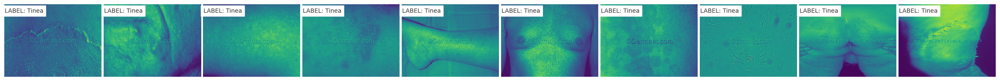

In [7]:
plotGridImages('Tinea',Tinea_train_files, Tinea_train_path,ncols= 10)

Psoriasis


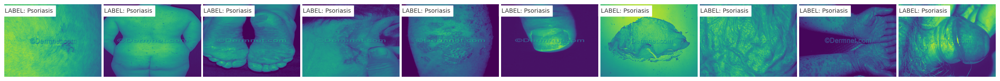

In [8]:
plotGridImages('Psoriasis',Psoriasis_train_files, Psoriasis_train_path,ncols=10)

Eczema


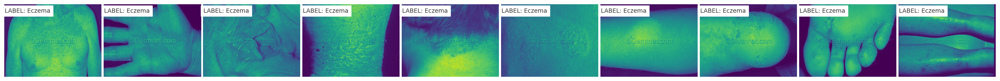

In [9]:
plotGridImages('Eczema',Eczema_train_files, Eczema_train_path,ncols=10)

Atopic


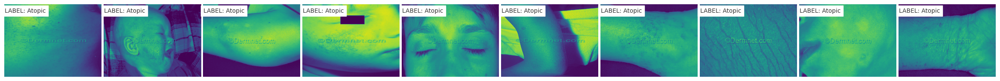

In [10]:
plotGridImages('Atopic',Atopic_train_files, Atopic_train_path,ncols=10)

In [11]:
final_df = pd.DataFrame()

In [12]:
Tinea_df = pd.DataFrame()
Tinea_df['Image'] = [Tinea_train_path+'/'+img for img in Tinea_train_files]
Tinea_df['Label'] = "Tinea"

Tinea_df.shape

(1299, 2)

In [13]:
Psoriasis_df = pd.DataFrame()
Psoriasis_df['Image'] =  [Psoriasis_train_path+'/'+img for img in Psoriasis_train_files]
Psoriasis_df['Label'] = "Psoriasis"

Psoriasis_df.shape

(1405, 2)

In [14]:
Eczema_df = pd.DataFrame()
Eczema_df['Image'] =  [Eczema_train_path+'/'+img for img in Eczema_train_files]
Eczema_df['Label'] = "Eczema"

Eczema_df.shape

(1235, 2)

In [15]:
Atopic_df = pd.DataFrame()
Atopic_df['Image'] =  [Atopic_train_path+'/'+img for img in Atopic_train_files]
Atopic_df['Label'] = "Atopic"

Atopic_df.shape

(489, 2)

In [16]:
final_df = final_df.append([Atopic_df, Eczema_df, Psoriasis_df, Tinea_df])

C:\Users\10224023\AppData\Local\Temp\ipykernel_12052\619702713.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df = final_df.append([Atopic_df, Eczema_df, Psoriasis_df, Tinea_df])


In [17]:
final_df.shape

(4428, 2)

In [18]:
final_df.sample(10)

,Image,Label
1016,D:\dermotology_research\dataset\train\Psoriasi...,Psoriasis
390,D:\dermotology_research\dataset\train\Psoriasi...,Psoriasis
1019,D:\dermotology_research\dataset\train\Eczema/n...,Eczema
762,D:\dermotology_research\dataset\train\Tinea Ri...,Tinea
1000,D:\dermotology_research\dataset\train\Eczema/m...,Eczema
960,D:\dermotology_research\dataset\train\Tinea Ri...,Tinea
515,D:\dermotology_research\dataset\train\Eczema/e...,Eczema
5,D:\dermotology_research\dataset\train\Tinea Ri...,Tinea
540,D:\dermotology_research\dataset\train\Psoriasi...,Psoriasis
366,D:\dermotology_research\dataset\train\Atopic D...,Atopic


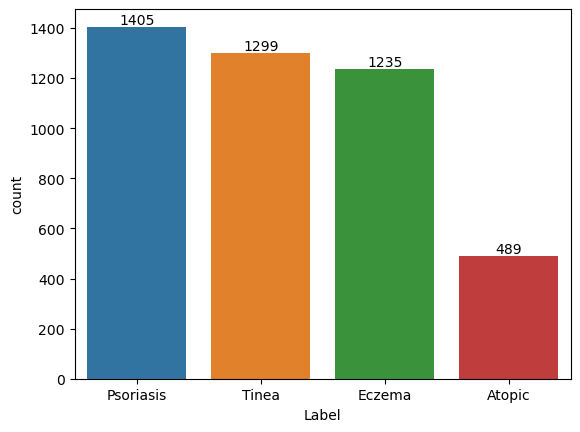

In [19]:
ax = sns.countplot(x=final_df['Label'],
                   order=final_df['Label'].value_counts(ascending=False).index);

abs_values = final_df['Label'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values);

In [20]:
final_test_df = pd.DataFrame()


Eczema_test_df = pd.DataFrame()
Eczema_test_df['Image'] = [Eczema_test_path+'/'+img for img in Eczema_test_files]
Eczema_test_df['Label'] = "Eczema"



Tinea_test_df = pd.DataFrame()
Tinea_test_df['Image'] =  [Tinea_test_path+'/'+img for img in Tinea_test_files]
Tinea_test_df['Label'] = "Tinea "



Psoriasis_test_df = pd.DataFrame()
Psoriasis_test_df['Image'] =  [Psoriasis_test_path+'/'+img for img in Psoriasis_test_files]
Psoriasis_test_df['Label'] = "Psoriasis"


Atopic_test_df = pd.DataFrame()
Atopic_test_df['Image'] =  [Atopic_test_path+'/'+img for img in Atopic_test_files]
Atopic_test_df['Label'] = "Atopic"


final_test_df = final_test_df.append([Tinea_test_df, 
                                      Psoriasis_test_df, 
                                      Atopic_test_df,
                                      Eczema_test_df])

final_test_df.shape

C:\Users\10224023\AppData\Local\Temp\ipykernel_12052\657469699.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_test_df = final_test_df.append([Tinea_test_df,


(1109, 2)

In [21]:
train_data_gen  = ImageDataGenerator(
                                    rescale=1 / 255.0,
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split=0.2,
                                    fill_mode='nearest')
test_data_gen = ImageDataGenerator(rescale=1 / 255.0)


batch_size = 8
train_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical", 
    subset='validation',
    shuffle=True,
    seed=42 
)
test_generator = test_data_gen.flow_from_dataframe(
    dataframe=final_test_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=1,
    class_mode='categorical',
    shuffle=False,
    seed=42
)

Found 3543 validated image filenames belonging to 4 classes.
Found 885 validated image filenames belonging to 4 classes.
Found 1109 validated image filenames belonging to 4 classes.


In [22]:
res = VGG16(weights ='imagenet', include_top = False, 
               input_shape = (256, 256, 3)) 
               
res.trainable = False


x= res.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
 
x = Dense(512, activation ='relu')(x)
x = BatchNormalization()(x)


x = Dense(256, activation ='relu')(x)
x = BatchNormalization()(x)

x = Dense(4, activation ='softmax')(x)
model = Model(res.input, x)

model.compile(optimizer =tf.keras.optimizers.RMSprop(learning_rate=0.0001),  
              loss ="categorical_crossentropy",  
              metrics =["categorical_accuracy"])  

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

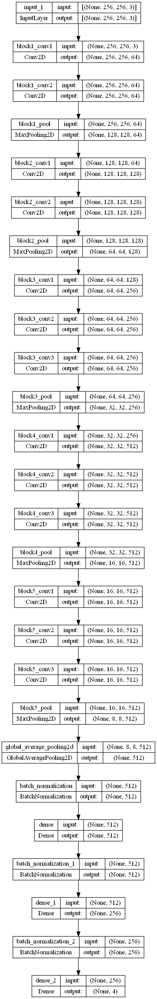

In [23]:
from keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [24]:
custom_early_stopping = EarlyStopping(
    monitor='val_loss', 
    patience=10, 
    min_delta=0.001, 
    mode='min')

history = model.fit(train_generator, 
                    epochs=50, 
                    validation_data=valid_generator,
                   callbacks=[custom_early_stopping])

Epoch 1/50
443/443 [==============================] - 472s 1s/step - loss: 1.5562 - categorical_accuracy: 0.3559 - val_loss: 1.9590 - val_categorical_accuracy: 0.1525
Epoch 2/50
443/443 [==============================] - 429s 967ms/step - loss: 1.2679 - categorical_accuracy: 0.4491 - val_loss: 2.4193 - val_categorical_accuracy: 0.1503
Epoch 3/50
443/443 [==============================] - 431s 972ms/step - loss: 1.1519 - categorical_accuracy: 0.4736 - val_loss: 2.8213 - val_categorical_accuracy: 0.1209
Epoch 4/50
443/443 [==============================] - 422s 953ms/step - loss: 1.1070 - categorical_accuracy: 0.4872 - val_loss: 2.7880 - val_categorical_accuracy: 0.1593
Epoch 5/50
443/443 [==============================] - 423s 955ms/step - loss: 1.0439 - categorical_accuracy: 0.5120 - val_loss: 3.1386 - val_categorical_accuracy: 0.1367
Epoch 6/50
443/443 [==============================] - 422s 952ms/step - loss: 1.0215 - categorical_accuracy: 0.5207 - val_loss: 3.1911 - val_categorical_

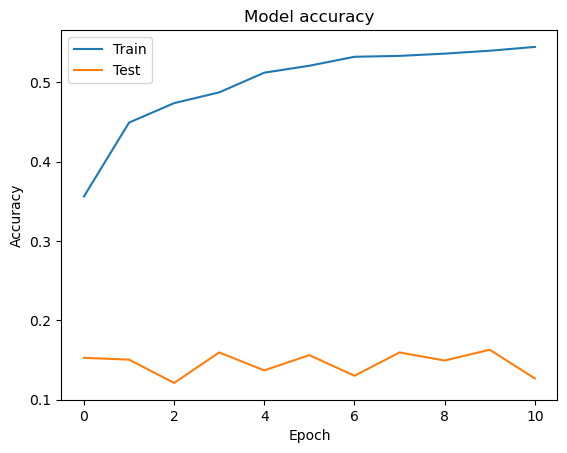

In [25]:
plt.plot(history.history['categorical_accuracy']) #sparse_categorical_accuracy
plt.plot(history.history['val_categorical_accuracy']) #val_sparse_categorical_accuracy
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

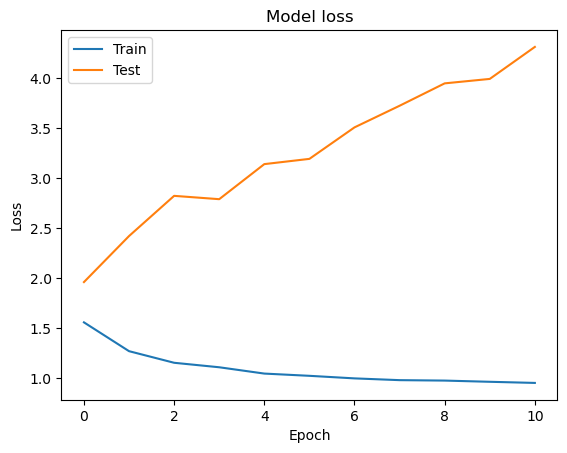

In [26]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

1109/1109 [==============================] - 113s 102ms/step


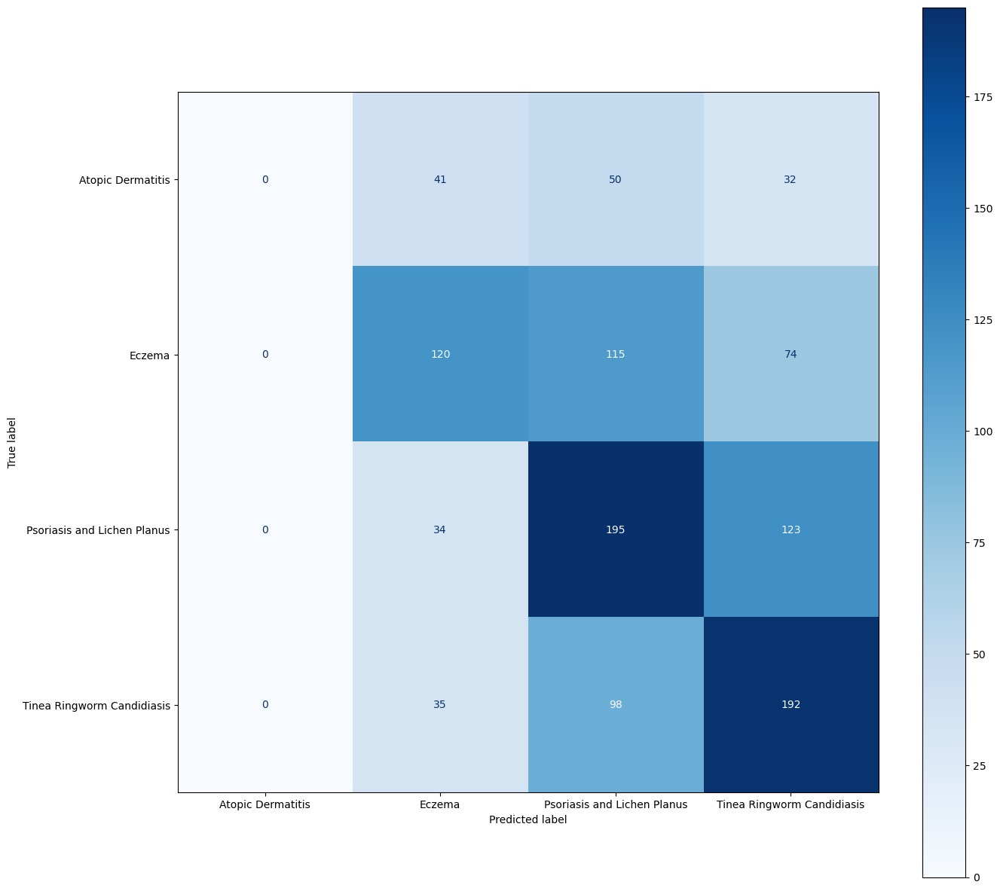

In [28]:
test_true=test_generator.classes
test_pred_raw = model.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Atopic Dermatitis', 'Eczema', 'Psoriasis and Lichen Planus', 'Tinea Ringworm Candidiasis'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

In [29]:
result = model.evaluate(test_generator,batch_size=32)
print("test_loss, test accuracy",result)

1109/1109 [==============================] - 110s 99ms/step - loss: 1.7011 - categorical_accuracy: 0.4572
test_loss, test accuracy [1.7011111974716187, 0.4571686089038849]


In [30]:
vgg_preds = model.predict(test_generator)
vgg_pred_classes = np.argmax(vgg_preds, axis=1)

1109/1109 [==============================] - 112s 101ms/step


In [31]:
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


vgg_acc = accuracy_score(true_classes, vgg_pred_classes)
print("VGG16 Model Accuracy: {:.2f}%".format(vgg_acc * 100))

VGG16 Model Accuracy: 45.72%


In [34]:
img = tf.keras.utils.load_img('D:\\dermotology_research\\dataset\\test\\Eczema\\03dermatitisDrug1122051.jpg', target_size=(256, 256))
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) 

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

1/1 [==============================] - 0s 232ms/step


In [35]:
score = tf.nn.softmax(predictions[0])

class_names = list(train_generator.class_indices)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to Eczema with a 47.54 percent confidence.


In [36]:
from keras.preprocessing import image
def predict_image_class(image_path,true_value):

    img = cv2.imread(image_path)
    img = cv2.resize(img,(256,256))

    img = np.expand_dims(img, axis=0)

    img_class = model.predict(img, batch_size=1)
    
    score = tf.nn.softmax(img_class[0])

    class_names = list(train_generator.class_indices)

    print(
        "This image most likely belongs to {}"
        .format(class_names[np.argmax(score)])
    )
    
    
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(15, 15))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 1), axes_pad=0.05)
    ax = grid[0]
    img = image.load_img(image_path, (256, 256))
    img = image.img_to_array(img)
    ax.imshow(img / 255.)
    
    ax.text(10, 150, 'True Label: %s' % true_value.upper(), color='g', backgroundcolor='w',\
    alpha=0.8, size = 20)
    
    ax.text(10, 200, 'Predicted Label: %s' % class_names[np.argmax(score)].upper(), color='k', backgroundcolor='w',\
    alpha=0.8, size = 20)
    ax.axis('off')
    plt.show()

1/1 [==============================] - 0s 99ms/step
This image most likely belongs to Eczema


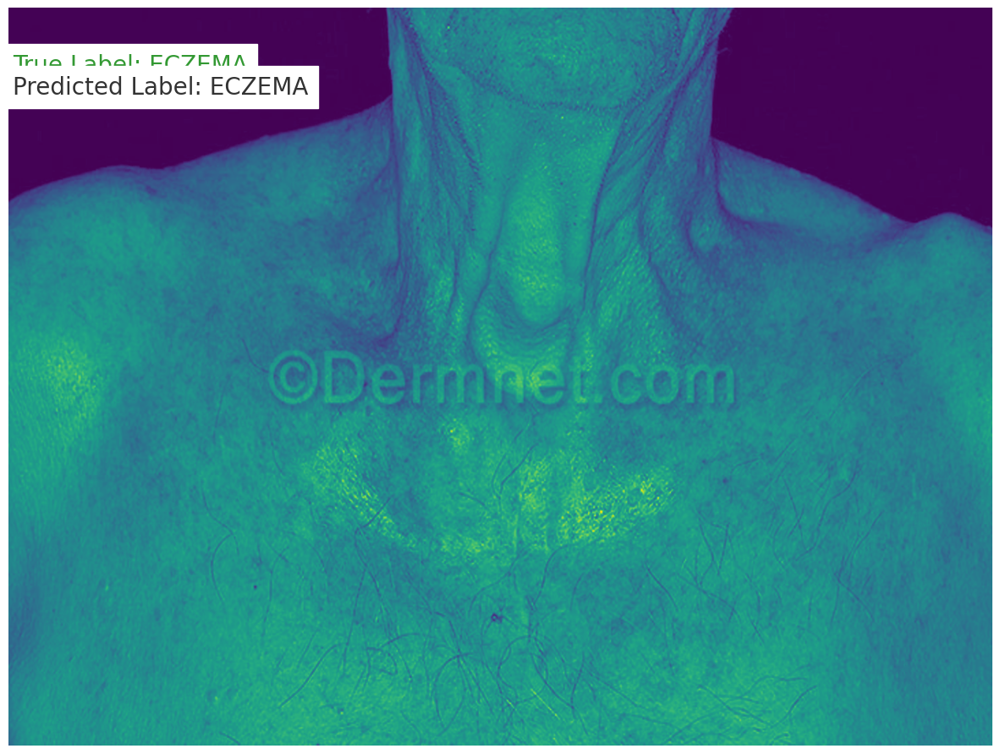

In [43]:
from tensorflow.keras.preprocessing import image
from keras.utils import load_img, img_to_array

predict_image_class('D:\\dermotology_research\\dataset\\test\\Eczema\\03dermatitisDrug1122051.jpg', 'Eczema')

1/1 [==============================] - 0s 99ms/step
This image most likely belongs to Atopic


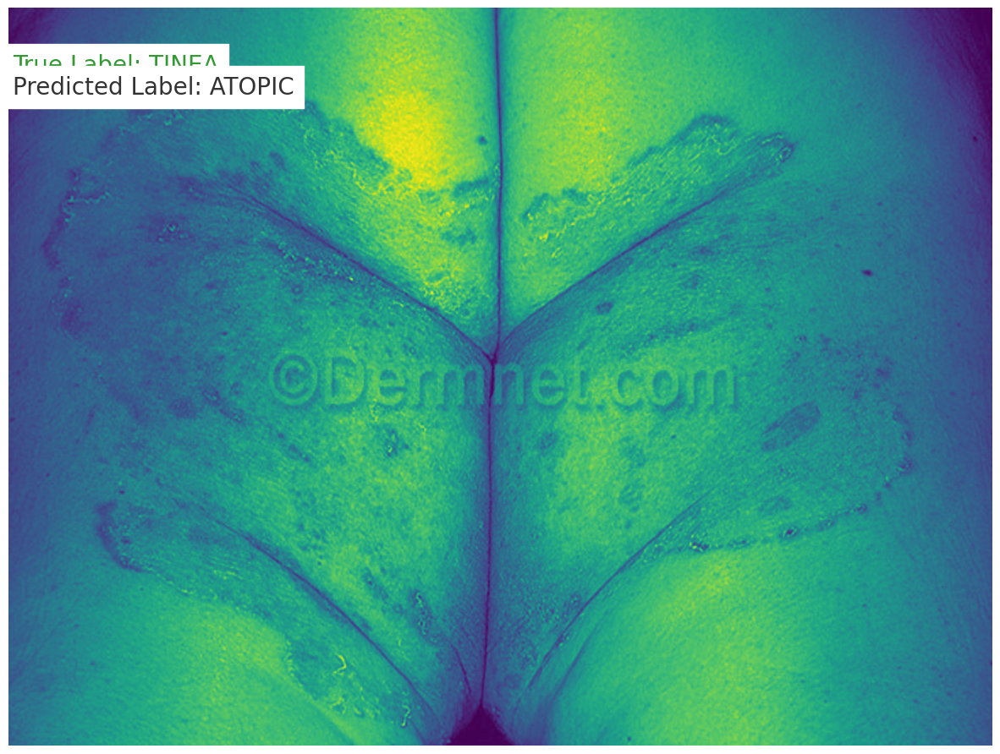

In [45]:
predict_image_class('D:\\dermotology_research\\dataset\\test\\Tinea Ringworm Candidiasis and other Fungal Infections/tinea-body-196.jpg','Tinea')

1/1 [==============================] - 0s 98ms/step
This image most likely belongs to Psoriasis


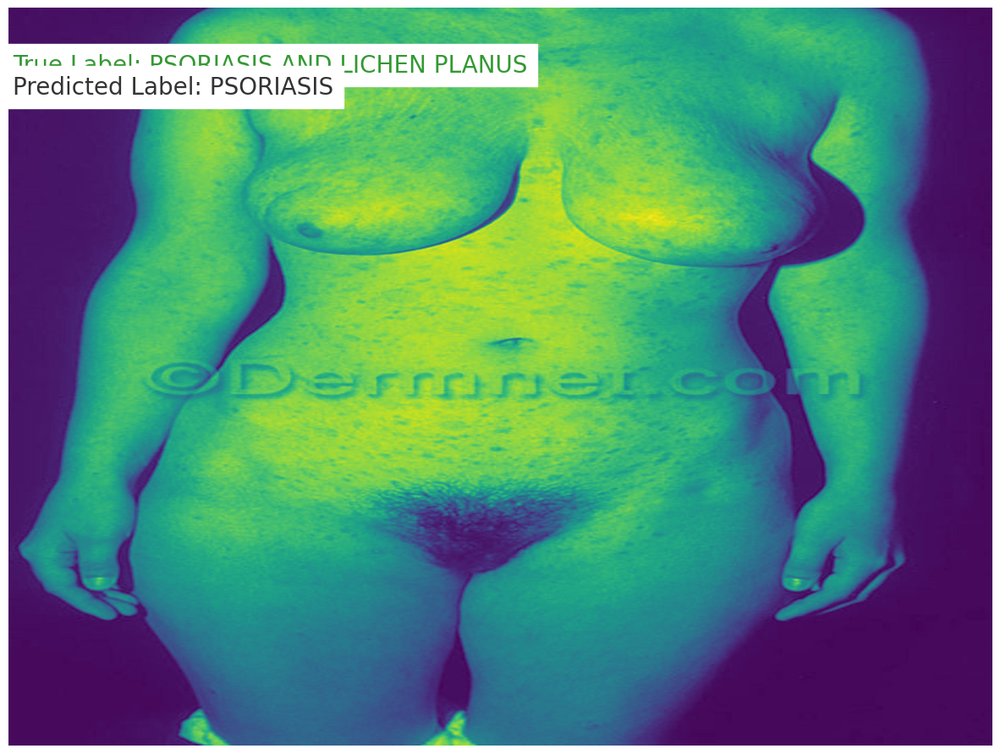

In [47]:
predict_image_class('D:\\dermotology_research\\dataset\\test\\Psoriasis pictures Lichen Planus and related diseases\\pityriasis-rosea-95.jpg','Psoriasis and Lichen Planus')

1/1 [==============================] - 0s 98ms/step
This image most likely belongs to Atopic


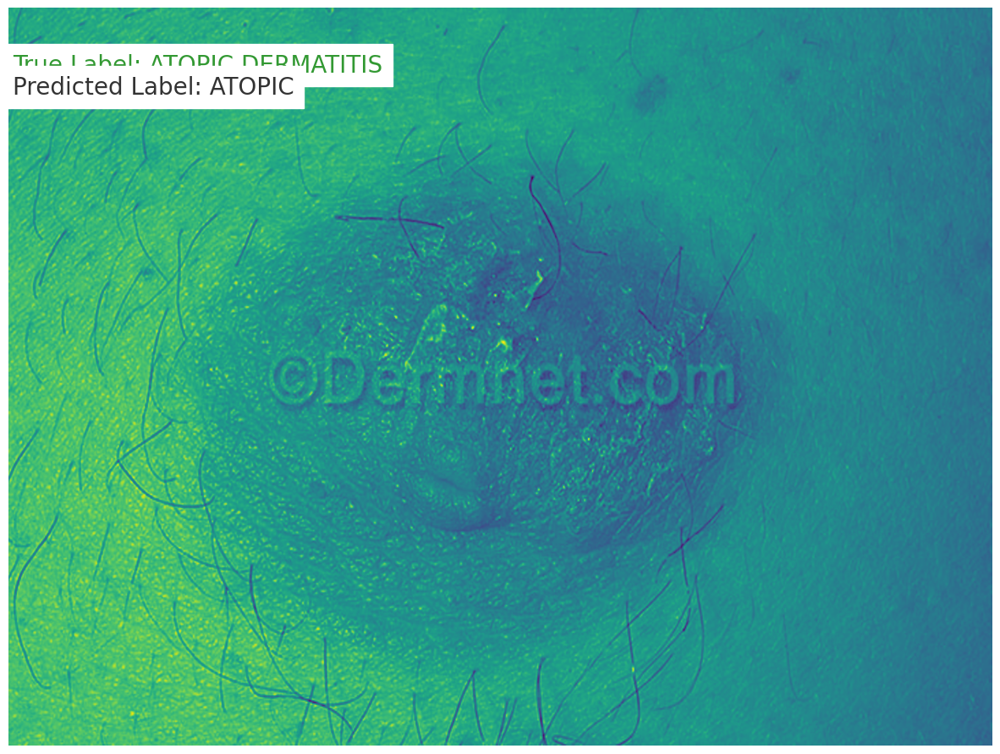

In [50]:
predict_image_class('D:\\dermotology_research\\dataset\\test\\Atopic Dermatitis\\03DermatitisAreola45.jpg','Atopic Dermatitis')

1/1 [==============================] - 0s 101ms/step
This image most likely belongs to Atopic


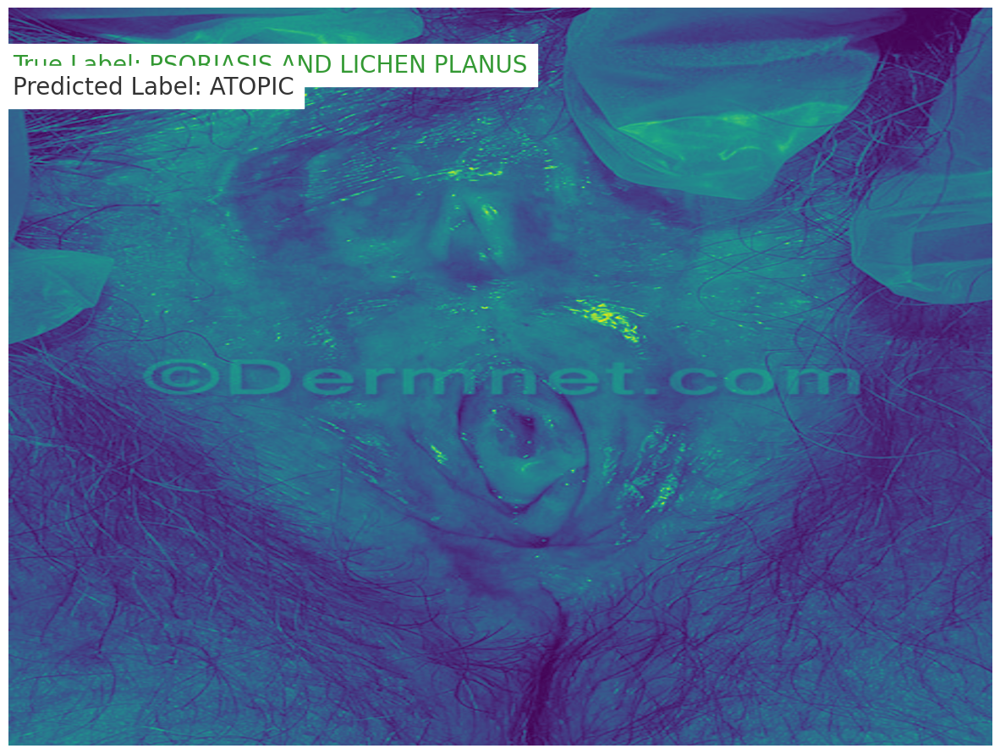

In [51]:
# Wrong predictions
predict_image_class('D:\\dermotology_research\\dataset\\test\\Psoriasis pictures Lichen Planus and related diseases\\Lichen-Sclerosis-Vulva-15.jpg','Psoriasis and Lichen Planus')